<a href="https://colab.research.google.com/github/SeamusHerrod/EECS-348-Software-Engineering-1/blob/main/EECS_348.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


#<center>**1/31 Announcements:**
<center> - There will be one Lab in C and one Lab in C++ 

<center> - continue conversation about C today, on Thurs. 2/2 start C++ 


#<center>General Template of a C program:

```c
#include <stdio.h> // included for any program that needs any form of input/output, 

//main section where work happens
int main()
{
  // variable declaration and function calls
  int x;
  int y;
  int x, y; // declare more than one variable at a time
  x = 5;

  int z, w = 0; // declare two integers, initialize w to 0, z is uninitialized

  return 0;
}
```

#<center>Find All Prime numbers from 0-100:

1. if a number in a range, in this case 0-100, is not divisible by the primes $\le\sqrt(upper limit)$ then it is a prime 
2. $\sqrt100 = 10$
3. divide each number from 0-100 by all the primes $≤ 10$
4. to find the primes ≤ 10, % each number by all ints < itself, excluding 1 
  * if a remainder is returned, then that number is not evenly divisible
  * if this loop is exited without ever returning 0, then that number is prime

In [ ]:
%%writefile icp2.c

#include <stdio.h>

int main()
{
  int x[4] = {2,3,5,7};
  int i, j;
  for ( i = 1; i < 100; i++ ) 
  {
    int count = 0;
    for ( j = 0; j < 4; j++)
    {
      if (i == x[j])
      {
	break;		
      }
      else if (i % x[j] == 0)
      {
	count++;
      }
    }
    if (count == 0)
    {
      printf("%d is a prime number\n", i);
    }
    count = 0;
  }

  return 0;
}

Writing icp2.c


In [ ]:
%%shell

gcc icp2.c -o icp2
./icp2

##<center>Pass by Reference:

```c
void swap ( int * x, int * y) //pass in value of x, and y
{
  
  int temp = *x //temp = value of x
  *x = *y; //value of x = value of y, x points to value of y
  *y = temp; //address of y points to the address of x, completing the swap
}
```

In [ ]:
%%writefile pass_point.c

#include <stdio.h>

void swap ( int * x, int * y)
{
  printf("swapping\n");
  int temp = *x; 
  *x = *y;
  *y = temp;

}

int main()
{
  int x, y;
  x = 1;
  y = 2;
  
  printf("x = %d\ny = %d\n", x, y);

  swap(&x, &y);

  printf("x = %d\ny = %d", x, y);

  return 0;
}

Overwriting pass_point.c


In [ ]:
%%shell 

gcc pass_point.c 

./a.out

```c

//THIS IS AN INFINITE LOOP
//n is decremented by one in the print statement, and another time by n-- in the for loop, 
  // this results in n being decremented by 2 for every loop 
      // n = 7, 5, 3, 1, -1
      // n never == 0, so the loop never ends
#include <stdio.h>

int main()
{
  int n; 
  for (n = 7; n != 0; n--)
  {
    printf("n = %d\n", --n);
  }

  return 0;
}

```

#**<center>Common I/O Functions in C:**
> ```printf()``` function - show output
>
> ```scanf()``` function - take input 
>> Example: ```scanf("%d", &n);```
>>
> ```getChar()``` and ```putChar()```
>> getChar() reads a single character 
>>putChar() writes a single character to terminal 
>
>```gets()``` and ```puts()``` function



#**<center>Arrays in C:**
##A collection of objects of the *same type* stored contiguously

```c
int A[10]
  // A is an array of 10 integers
  //A[0], A[1],...A[9] (ZERO INDEXING)

double B[20]
  // B is an array of 20 long floating point numbers
```
Arrays of ```structs, unions, pointers, etc...``` are also allowed

```c
int c[];
  // an array of an unknown number of integers (allowable in a parameter of a function

int D[10][20];
  // An array of 10 rows, each of which is an array of twenty integers
    // technically, this is an array of 10 elements, where each element is an array of 20 items
  // D[0][0] refers to position 0 of row 0
```
##Array Element:
May be used wherever a variable of the same type may be used
>>In an expression (including arguments)
>>On left side of assignment

Example:
```c
  A[3] = x + y;

  x = y - A[3];
```
**C does NOT check *array* bounds**


Outside of any function - always static

>*static* ==> retains values across function calls

```c
int A[13];

#define CLASS_SIZE = 73
double B[CLASS_SIZE];

const int nElements = 25;
float C[nElements];
```
Inside a function: 
>gcc supports the following:
```c
void func(<other parameters>, const int n)
{
  double Arr[2*n];
}
```
* i.e. array size is determines by evaluating an expression at run-time
  * Automatic allocation on The Stack
  * Not in C88 ANSI standard, not in Kernighan & Ritchie
  * Part of C99 C++ 

##Array Initialization:

```c
int A[5] = {2, 4, 8, 16, 32};

int B[20] = {2, 4, 8, 16, 32};
  // first 5 values intitialized to given values, the rest initialized to 0

int C[4] = {2, 4, 8, 16, 32}; // ERROR: compiler will not allow this

int days[] = {31, 28, 31, 30, 31, 30};
  // array is created with as many elemnts as initial values
    // in this case, 6
```
##Size of arrays:
```c
sizeof(int) = # of bytes per int
sizeof( float ) = # of bytes per float
sizeof days = number of elements in an array
```

##Initializing a Two-Dimensional array:
```c

int daytable[2][5] = {1,2,3,4,5},
                     {6,7,8,9,10};
```



#**<center>Pointers In C:**
* Used Everywhere
  * For building useful, interesting, data structures
  * For returning data from functions
  * For managing arrays

* **'&'** unary operator generates a pointer to **x**
  * e.g. **scanf("%d", & x);**
  * e.g. **p = &c;**
  * Operand of '&' must be an *lvalue* - a legal object on lefthand of assignment operator ('=')

* **'*'** unary operator *dereferences* a pointer
  * i.e. gets value pointed to
  * e.g. **'*p'** refers to the value of c


```c
int A[10];
int *p;
  //type of A is int * technically 

p = A; and A = p; //are legal assignments
```

#<center>Lab 3 Problem 1: sales report generation
> Read 12 monthly sales
>
> Print the sales in a nice report 
>
> Print the minimum, macimum, and avg. sales reports
>
> Print 6 month moving averages
>
> Print sales report in descending order 

#<center>Lab 3 Problem 2: football scoring possibilities 

> given an integer representing a score in an NFL game, write a program to determine all possible combinations of scoring plays that can result in that score
>
>A scoring plays in an NFL game can be the following:
>
>>safety worth 2 points
>>
>>Field goal worth 3 points
>>
>>touchdown worth 6 points
>>
>>touchdown + extra point field goal worth 7 points
>>
>>touchdown +2 point conversion worth 8 points

#<center>Quiz 2 
Question 1: A C program must have at least one function

Question 2: printf("%d", (a++)); //prints current value of a then increments a

Question 3: for(j=1; j<=10; j=j-1) //executes forever

Question 4: if((a>b) && (a<= c)) a = a + 1; else c=c+1 //a = 11 c = 10

Question 5: int j = 1, num1 = 4; while(++j <= 10){num1++} //num1 = 13



#**<center>C++:**
- C++ is an industrial strength programming language
- C++ evolved from C, developed by Bjarne Stroustrup in 1979 at Bell Laboratories
  - C++ is an increment from C
- C++ precompiler translates all C++ programs into C 

##<center>Software Engineering Observations of C++:
- use a "building-block" approach to create programs, avoid reinventing the wheel. use existing pieces
  - software reuse, central idea to object-oriented programming
- using C++ standard libary functions shortens development time, and they are all very efficient 

#<center>Compiled Programs
- Compiling a high-level language program into machine language can take considerable amount of computer time
- Interpreter programs were developed to execute high-level language programs directly (without the need for compilation)
  - although more slowly than compiled programs
- Scripting languages such as JavaScript and PHP are processed by interpreters



#<center>Key SE concepts supported by OO languages
- Classes 
  - Attributes and methods
  - Member functions 
  - Maybe public, private, or protected 

- Encapsulation
  - Information hiding (gon be on da quiz) 

- Inheritance 
  - Single, double 
  - Facilitate reusability

- Polymorphism

In [ ]:
%%writefile main.cpp

#include <iostream> 

int main()
{
  std::cout << "Hello World" << std::endl;
  printf("Hello World\n"); //notice that printf still works 
  return 0;
}


Overwriting main.cpp


* ">>" is known as the stream insertion operator 

In [ ]:
%%shell
g++ -std=c++11 main.cpp -o main 
./main

Hello World
Hello World


#<center>Flow Control in C++ 

- if...else is same as C

  - be wary of the dangling-else 
  ```cpp
  if (x > 5) 
      if (y > 5) 
        cout << "x and y are > 5";
  else //this else is actually associated with the second if statement, 
         //Remember, C++ does NOT match whitespace 
      cout << "x is <= 5";
  ```
  - Every 'else' will match the preceding if statement, remember C/C++ completely ignores whitespace 

  - **to make the above more explicit:**
  ```cpp
  if ( x > 5 )
  {
      if ( y > 5 )
      {
        cout << "x and y are > 5";
      }
  }
  else
      cout << "x is <= 5";
  ```

- While statements:
  - same as C 

- For statement
  - same as C 

```cpp
for (unsigned int counter = 1; counter <= 10; ++counter)
```
- using unsigned int in for statements is for type safety and efficiency

- do...while
  - body of do...while will alwasy run ONCE before checking the while condition

```cpp
do
  statement;

while(condition);

```


- The Switch statement example:

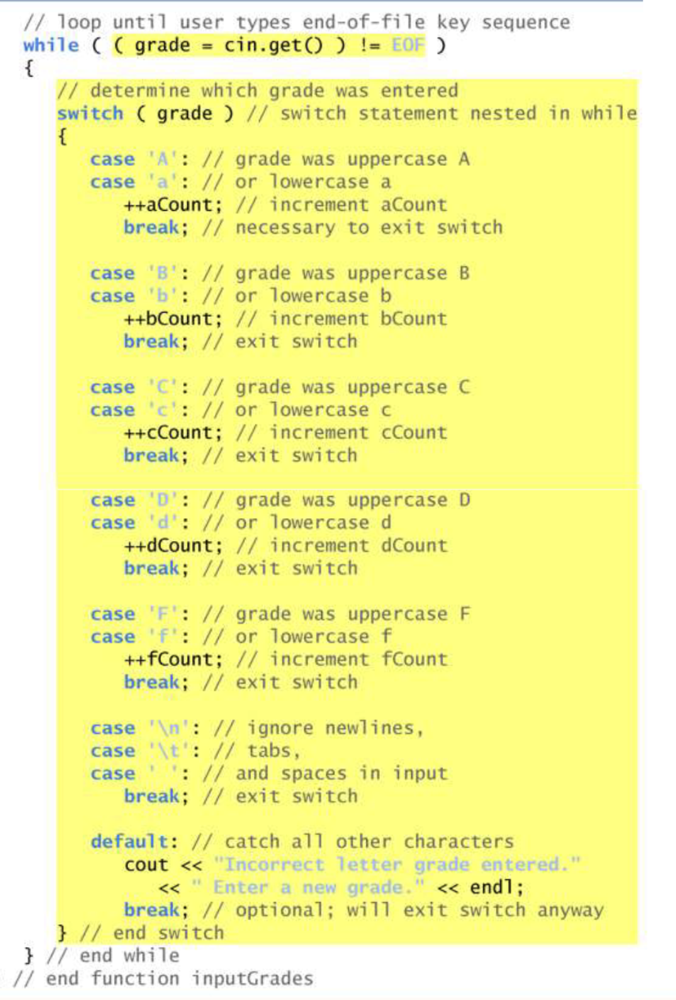

#<center>**Function Prototyping**

- Also known as a function prototype. (also called function declaration)
- a Function prototype tells the compiler 
  - The name of a function
  - type of data returned by the function 
  - The number of parameters passed to a function
  - the type of paramters passed to a function 
  - the order in which those parameters should be passed to the function

- These are used in header files 
  - separates function declaration and implementation 





#<center>**Storage Classes**

Keywords *extern* and *static* declare identifiers for variables with static storage duration
  - extern is visible outside current file
  - static visible within 
    - static declared local variables retain their values after the function returns


#<center>**Scope Rules:**

- The portion of a program where an identifier can be accessed 
  - Block scope 
  - Function scope 
  - Global namespace scope 
  - Function-prototype scope

#<center>**Function Overloading:**

- C++ enables several functions of the same name to be defined, as long as they have different signatures 

- C++ compilers selects to correct definition of an operator based on the number, types, and order of the arguments/parameters passed to that function 

- Function overloading is used to customize the functionality of certain operators 
  - Ex: define the behavior of adding two matrices 

#<center>**Exam Format**

True/False 

Matching 

Short Answer 

Coding, C/C++: 
  - Ex: write a for loop to print all numbers evenly divisible by 3 and 9
  - Basic Algorithm construction 
  - understand some pre-written code 

Scratch Paper is allowed to work through pre-written code 
  - This will be the GOATED strategy honestly 


BEST WAY TO STUDY: 

> Lecture notes/slides 
>
> Basically just go through slides and understand the language constructs 
>
> Software development lifecycles, maintenance lifecycle, internal lifecycle
>> Development processes 
>>
>>Mainetance processes


Exam will be normal 60min, probs shouldn't take that long 


#<center>**Mistake you keep making**

**Remember that anytime a variable is used with a '++' its value WILL change 
either before or after using the current value** 

EX:
```c
a[5] = {5, 1, 15, 20, 25};

int i, m;

i = ++a[1] = incremented value of a[1] = 1 + 1 = 2;

m = a[i++] = a[current val of i] = a[2] = 15, BUT

because i++ is in here, after m is assigned to a[2], i++ changes the value of i

so now i = 3

printf("i = %d\nm = %d", i, m)
// >> 3
// >> 15
```

#<center>**C++ function templates:**

used to make the datatype associated with a class is generic, meaning it could potentially be used with many data types, as long as constructors/deconstructor are defined for that type

#<center>**Data Types in C++:**

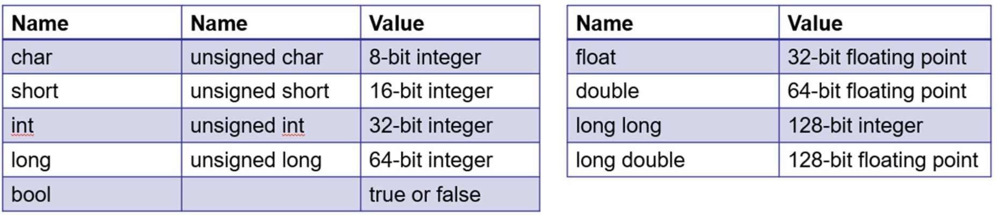

##<center>**Type Casting:**

- C++ is strongly typed; it will auto-convert a variable of one type to another in a limited fashion (won't change the value)

#<center>**Object-Orientation in C++:**
- Classes:
  - Defines a set of data items and structures (data members)
  - Defines a set of operations (operation members)
    - Also called methods
    - Also called functions 
    - Also called services 
    - Also called Class behavior
  - Encapsulates the two
  - Indicates which of the above members are accessible (public) and which are inaccesible (private)
    - Use of access specifier: **public, private, protected**
  - A class defines an abstract data type 
    - Examples: **course, student, teacher, book, account, printer**

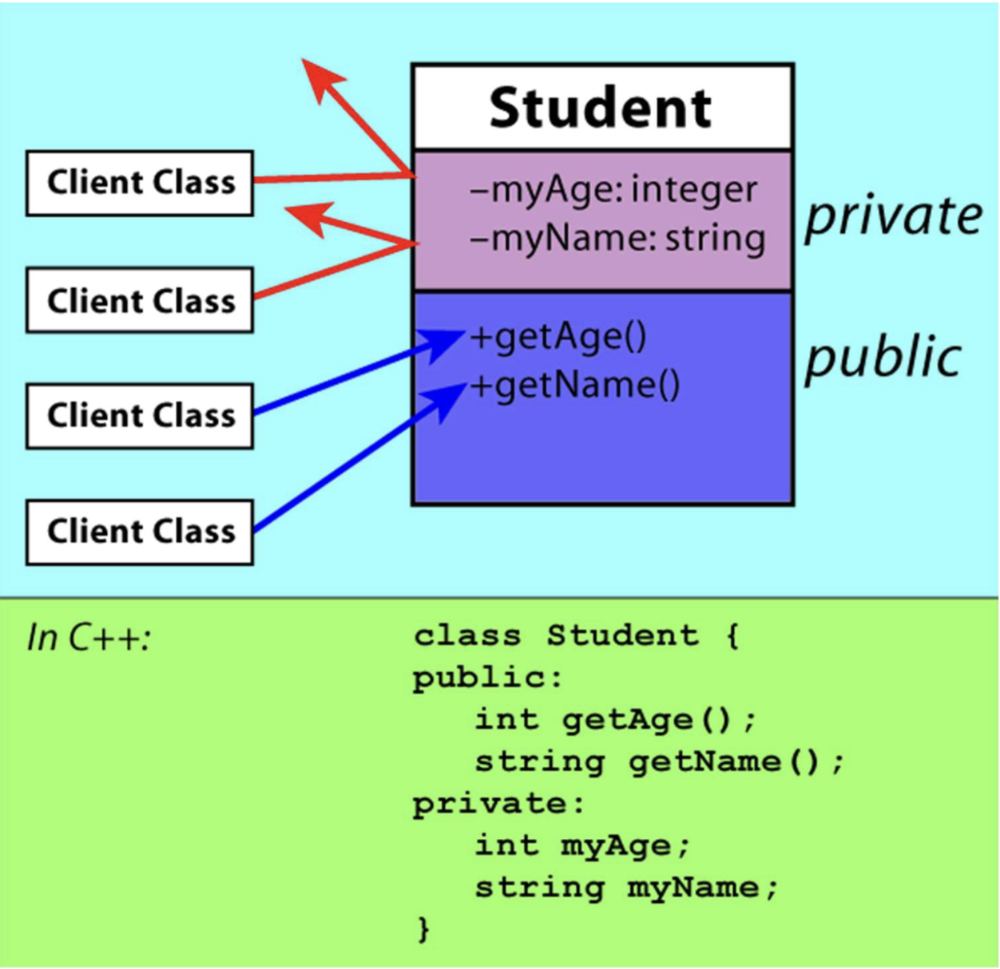


Notice in the above diagram that the model above is not language specific, 

The diagram uses UML - Unified Modeling Language 
  * UML decouples the structure of an object/class and its implementation
  * useful for "translating" a data structure into multiple languages

##<center>**Constructor and Destructor Methods:**

* The Constructor Function:
  * A specialmember function that initializes the data members of a class object
  * Cannot return values
  * has the EXACT same name as the class
* The Destructor Function:
  * implicitly called 
  * a special function named "~ClassName" 
  * CANNOT take arguments, CANNOT be overloaded 
  * performs garbage collection

##<center>**Class and object definition:**

```c
class Box 
{
  private: 
    //data members 
    //function members
  public:
    // function members

}

int main()
{
Box Box1; //declares object, Box1, of type Box 
Box Box2; //declares object, Box2, of type Box 

}

```

use .notation to call class methods 

```c
int main()
{
  Box Box1;
  Box1.MethodCall();
}

```

#<center>**Example Class definition and use**

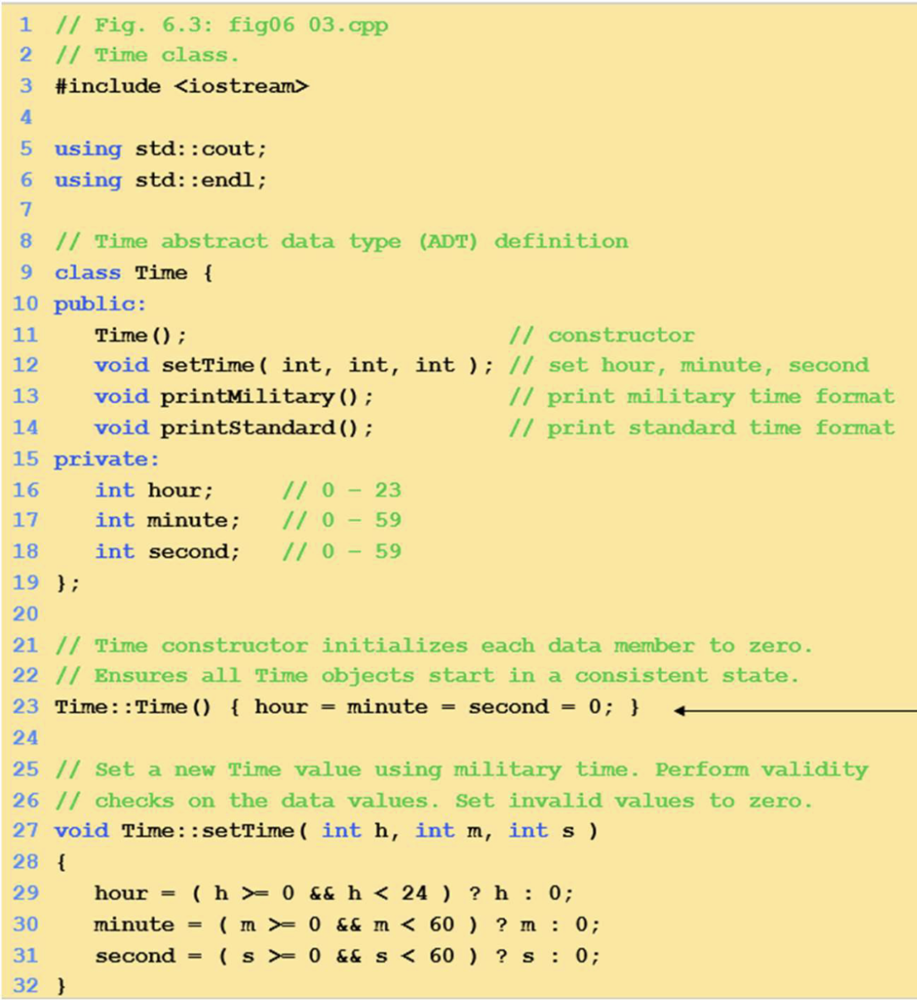

#<center>**Review: Last week and This Week**

* Last Week:
  * C++ 
  * Exam 1
  * Lab 3 and extra credit lab

* This week
  * Sofware development life cycles 
    * why modeling 
    * Requirements Engineering
  * Lab 4 (C++/IDE/git)
  * More extra credit? 


**NEED TO DO THE EXTRA CREDITS TO MAKE UP FOR EXAM 1 GRADE**


**ALSO MAKE SURE TO CHECK WHICH PROBLEMS YOU MISSED ON EXAM**

##<center>**Why Software Engineering:**

* Software is vital to US's global competitiveness, innovation, and national security
* Also economy, IT infrastructure, healthcare, education depend on software 
* Great research opportunities (if you plan on grad school)

* Great professional opportunities
  * Be a part of the excitement
  * Fun to develop new products 
  * Focus and the recommendations of the course 

#<center>**A Development Process:**

* A **Process** is a set of activities that are planned an performed to achieve a given purpose
  * Roles and responsibilities
  * Tools
  * Procedures and methods that define how do the tasks and relationship between the tasks

* why a Process
  * Provides guidelines and a structure 
  * Provides for consistency; minimizes redundancies 

Activities may have different names

* Requirements Engineering:
  * Requirements analysis 
  * System Requirements 

* Software development activites may be presented as a set of activities:

* Requirements engineering
  * Requirements elicitation
  * Requirements analysis 
  * Requirements modeling 
  * Requirements validation

* Design
  * Architectural design
  * Data structure design
  * Component design
  * Interface design 

##<center>**Software development models:**

* describe the ordering of development activities and the expected artifacts (outcomes) from each activity 

* Many development models 
  * Planned, disciplined ("linear") models (e.g. the waterfall model)
  * Prototyping model
  * phased or incremental models (the Unified Process Model)
  * Spiral model 
  * Agile models 

##<center>**Planned, disciplined models**

* Waterfall model ( and its variations )
* One of the first process development models proposed 
* works for well understood problems with minimal or no changes in the requirements
* Each major phase is marked by milestones and deliverables (artifacts)

* Long wait before a final product 

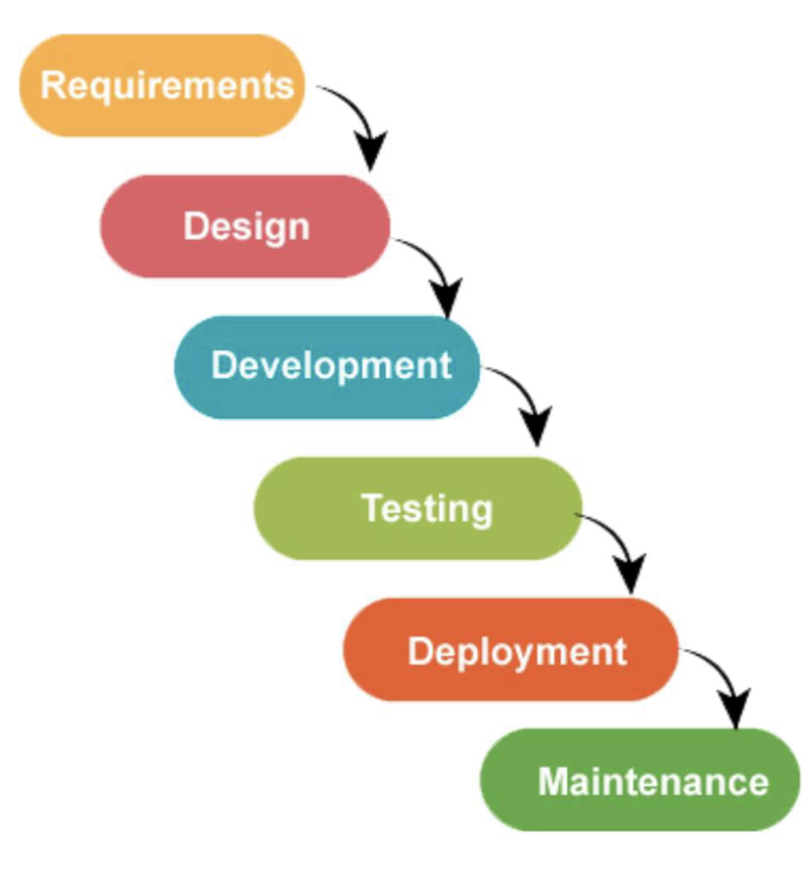

When is this model good? bad? 

Good:
  - in large companies with very expensive and complex softwares each stage needs approval and validation, and have many moving pieces, so this makes sure that each stage is complete and approved/validated before the next is started

Bad:
  - this model moves slowly, meaning it could take a long time before a final product is ever seen
  - also if you discover new requirements later down the waterfall, then it may be very difficult to implement those changes, again increasing the amount of time before the product is completed 

##<center>**Incremental and Iterative Models:**

* Also known as phased models 

* Incremental development: start with small fucntionality, add new functionality with each new release 

* Iterative development: Build the whole system, in a basic way, and then enhance functionality with each release 

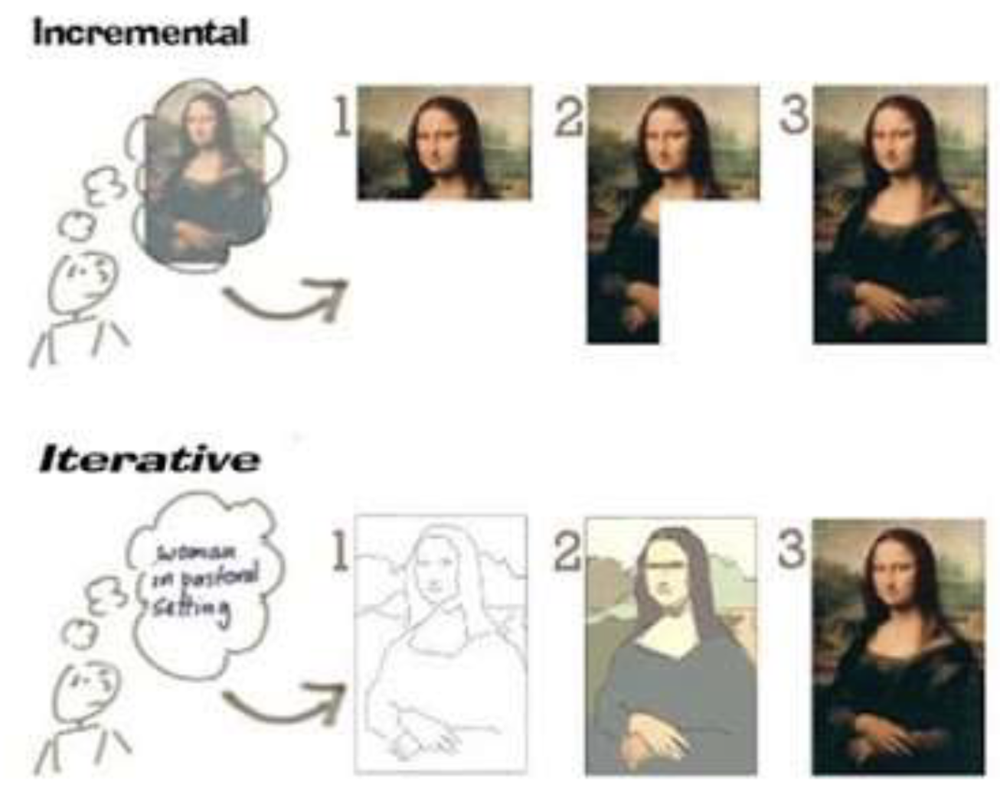

##<center>**Agile Models:**

* Iterative AND Incremental 

* Several well-known agile models --Scrum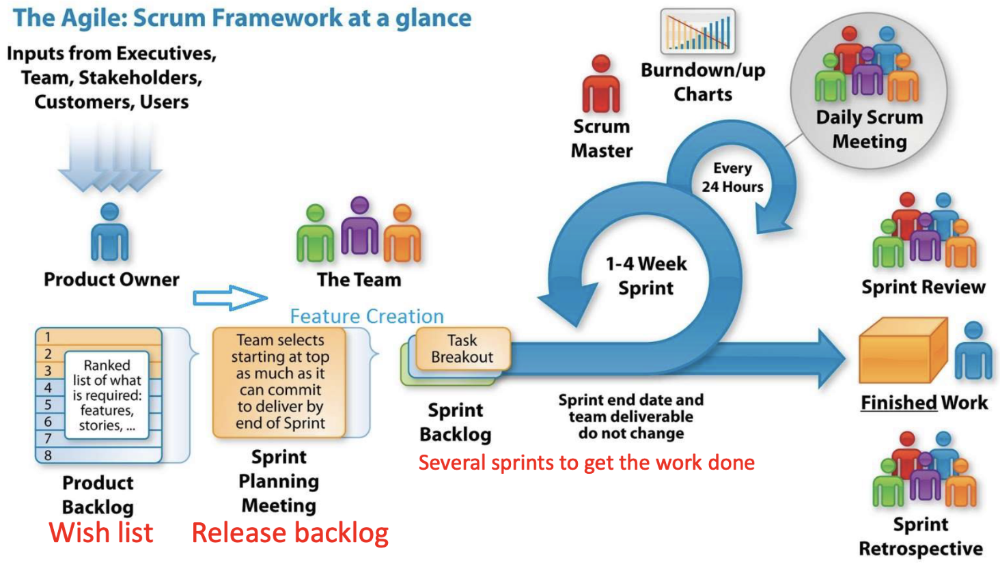

##<center>**Scrum Development Methodology:**

* One of the most populat agile software development mathodologies 
  * Other ones?

* Important Scrum Concepts
  * Team roles
  * Product Backlog
  * Sprints 
  * Burndown charts 
  * Estimation techniques
  * Sprint retrospectives 

##<center>**Scrum Roles:**

* Product Owner:
  - Makes sure the right features get into a new release (representing the users, customers)
  - sets direction

* Scrum master (project manager)
  - ensures the project progresses smoothly
  - Team members have the tools to get their job done 
  - Sets up meetings, monitors, plans releastes

* Developers, testers, customers, ... 

##<center>**Developing your cool new app:**

* You will get FEATURE requests from a variety of stakeholders
  - features are always from the perspective of the end users 
  - known as user stories: "As a user (role) I want 2F authentication"
  - the role could be a customer, an end user, executive,...
  - Backlog: a collection of user stories (or wish list)
    - Must decide which goes into a release 

##<center>**Release Planning:**

* start with the user stories and create a release backlog

* Prioritize and estimate time for each

* Larger one may be broken down 

##<center>**Agile Models:**

XP - extreme programming 

scrum - the new standard 

#<center>**Why Modeling? Into to UML**



##<center>**Organization:**

* Why modeling?
  * Why UML?

* UML use-case modeling 
* UML class diagrams 
* UML state transition diagrams 
* UML sequence diagrams 
* A case study 


**Modeling is a powerful tool:**

* Problem domain model
* Apply abstractions ( for the world, abstract to continents, oceans, then countries, etc... )
* Create a representation model

##<center>**Database Modeling:**

* A Bank Client:
> Address 
>
>Asset class
>
>Will have at least an account
>> Account No.
>>
>> Balance

##<center>Why Model?

* Helps us to visualize a system as we want it to be

* Permits use to specify the **structure** or **behavior** that is desired

**<center>What do we do with a model?</center>**

* Serves as a basis for development 
* serves as a communication tool 
  * To unify our views 
* serves as a reasoning tool
* Facilitates Documentation

##<center>**Principles of Modeling:**

* Models may be expressed at various levels of abstraction/detail/precision

* The best models are conceptually connected to reality

* No single model may be sufficient
  * models represent (stakeholder) views, and those views may differ from person to person


Imagine views of the human body:

the human body could be views as a nervous system, or a diagram of a heart/organ, vs a sonogram of the same organ (they represent the same thing, but one is a drawing representation, while the sonogram is a different view)

Views of a car:
  * style vs interior/comfort vs. technical specs. vs. price 
    * they all are representative of the same vehicle but they describe different aspects of that same vehicle 

    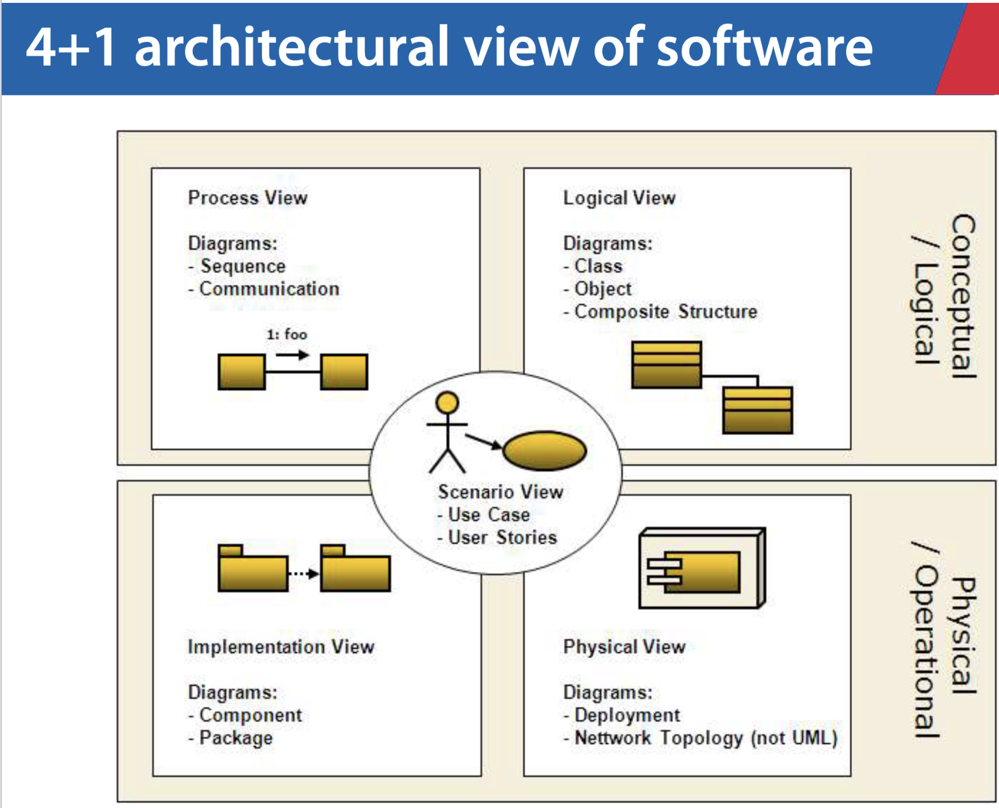

##<center>**UML is a modeling language:**

* Unified Modeling Language:
> Not a process
>
> A visual language for specification and documentation
>
> The defacto OO modeling language
>
> mostly for software engineering
>
> uml models can be mapped into programming languages 

##<center>**UML Diagrams:**

- a set of 13 different diagrams using static and dynamic groups 

**Static:**
> also called structural
>
> describes class diagram, components, objects, etc...

**Dynamic:**
> Also called Behavioral
>
> diagrams emphasizes the dynamic 
behavior of a system by showing collaborations among objects 
and changes to the internal states of objects 
>

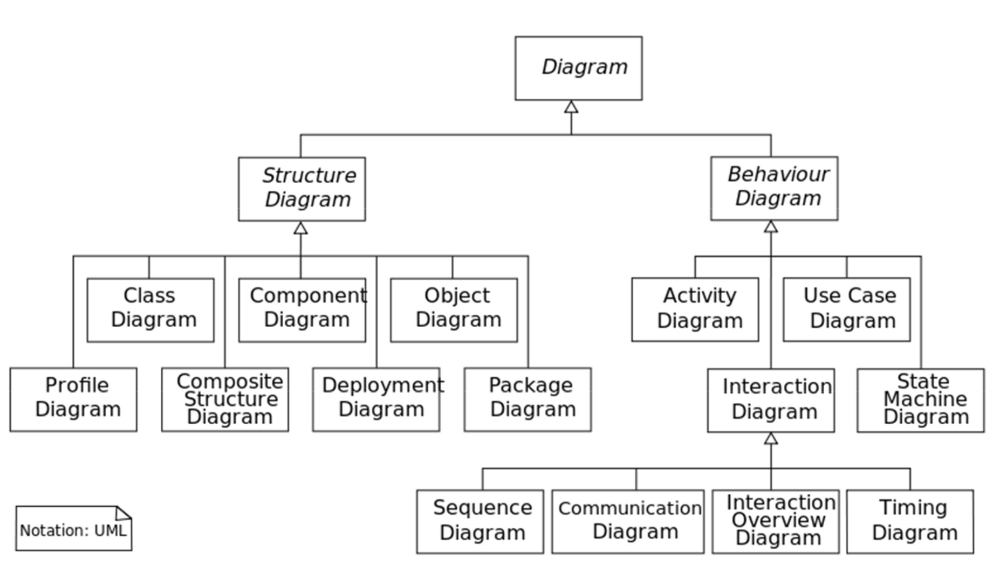

These different diagrams provide a different kind of convenience for describing a system in terms of different things depending on that systems's requirements

##<center>**UML diagrams in terms of system models**

* What are the Requirements:
  * talk to client, observe, get historical records
  * create scenatios and USE CASE DIAGRAMS

* What is the structure of a system:
  * create CLASS DIAGRAMS
  *  Identify objects, associations and their multiplicity, attributes, operations

* What behaviors to expect:
  * create create sequence diagrams 
  * transfer state diagrams 

* What installation to expect:
  * Identify dependencies between code using component diagrams
  * Show the runtime structure system with deployment model 

##<center>**Are all diagrams important**

YES, but depends on the level and objectives of modeling

* High priority for Learning:
  1. Use case, class, state transition, interaction diagrams
  2. Activity, component, deployment diagrams 
  3. other diagrams 

##<center>**UML is not a complete language**

* comprehensive, powerful and expressive constructs 
* Not complete 
* Not formal 
* A complementary formal language: Object Constraint 
Language (OCL)

##UML drawing tools 

* Visual Paradigm visual-paradigm.com
* Rational Software modeler ibm.com 
* Altova altova.com
* Microsoft Visio 
ect... 


##**Review content more regularly**

#<center>**A Brief Overview of Requirements Engineering**


##<center>**Requirements Engineering:**

* set of activites that identify, document, and communicate the purpose of a new software
* process that acts a bridge between the real-world needs of users and the capabilities afforded by the software
* process of establishing the **functionalities** (services) expected from a new software and the **constraints** under which it operates and is developed 
<br><br>
* Two Important Questions:
1. **Why** a new system is needed, based on current/foreseen conditions
2. **What** system features it will provide 

##What is Requirement:

* A requirement is an expression of desired behavior
* May range from high-level abstract statement of a service, OR of a system constaint to a detailed mathematical specification
  * basically a description of functionality

* Requirements are a specification of what should be implemented

##Where Requirements Come from:

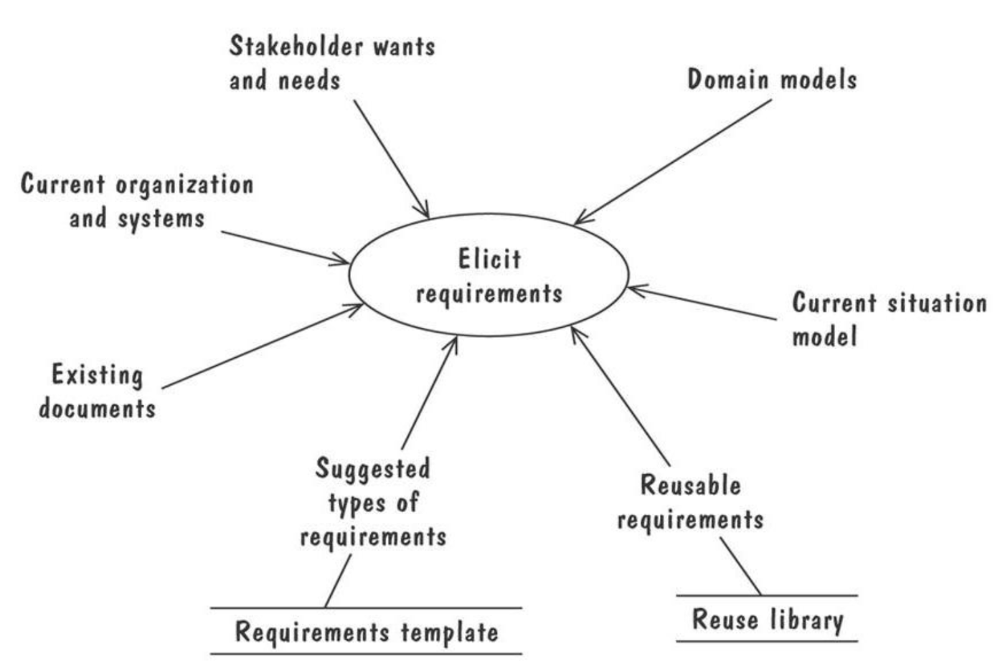

##Commen RE activites:

* Domain Engineering
* Requirements Elicitation
  * many different techniques
* Requirements documentation
* Requirements validation

##**Domain Engineering:**

* Before software is developed, understand the requirements
* before requirements can be finalized, must understand the domain
* What is domain?
  * an area of natural or human activity
    * healthcare, railway, finance, ect...
  * other terms:
    * domain analysis, understanding, domain modeling

Example of a specific domain:

  * Railway
    * tracks, lines, platforms, switch, etc...
    * Rail: length, topology, context ( in a tunnel? or along a platform? )

##Summary:

* The domain model captures concepts in the domain of the problem and the relationships between concepts
* define/establish vocabulary of the problem 

##<center>**Requirements Elicitation:**
Objective: to identify the key stakeholders, and to 
communicate and collaborate with them to identify and 
document a software product features

**Artifact Driven:** rely on specific types of documents (artifacts) to derive knowledge
>background study
>
>survey
>
>reports, etc...

**Stakeholder Driven:** rely on specific types of interactions with stakeholders to obtain knowledge of the problem
>interviews 
>
>ethnographic studies
>
>group sessions, etc...

Types of Requirements:

Functional requirements
* Describe what the system should do
* Address the “WHAT” aspects
* Functional requirements characterize units of functionality that 
are sometime called features i
  * Example: the train control software shall control the acceleration 
of all the system’s trains

NonFunctional Requirements:
* Define constraints on the way the software should satisfy its functional 
requirements

Constraints:
* Use the spiral model, use C++ for programming, ...

##<center>**Requirements Documentation:**

* Consists of detailing, structuring and documenting the characteristics of the new software

* Common Artifacts:
  * software requirements definitions in an easy to understand language 
  * Software Requirements Specifications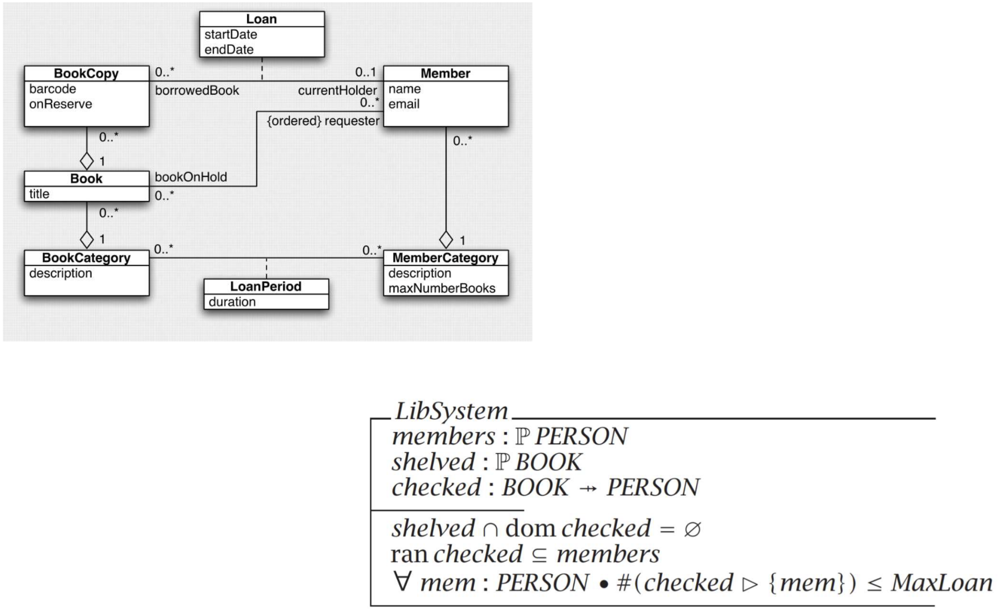 

##<center>**Requirements Validation:**
* Objective: quality assurance 
* The specs should be *verified* against each other in order to find inconsistencies and omissions

* the specs should be *validated* with stakeholders in order to pinpoint inadequacies with equal respect to actual needs

> Verification is done WITHIN the team
>
> Validation is done by others

##Summary: characteristics of good requirements:

* Completeness: requirements, assumptions, domain properties are sufficient 

* consistency: requirements are compatible with each other

* unambiguity: requirements are formulated in such away as to preclude any different interpretations of the problem

* good structuring: organized in a way that highlights the stuctural links among its elements

* feasibility: requirements are realizable in view of budget, schedule, tech constraints 

* Traceability: context in which requirements are captured are easily findeable 

#<center>**Use Case Modeling:**

Objective: discover/document the functional requirements of software product/system
  - use cases capture interactions between the system actors to achieve user goals
  - use cases capture who (actor) does what (interaction) with the system, and with what purpose (goal) without dealing with system internals
  - complete set of use cases specifies all different ways to achieve a goal with the system, and thus, defiles all behavior required of the system

* DESIGNED TO BE UNDERSTOOD BY NON-TECHINCAL PARTIES

##Use case at a glance:

* a use case is a sequence of transactions performed by a system, which yield observable result of value for a particular actor
  * The system being used (treated as black box)
  * The actor involved (type of user) 
  * functional goal the actor achieves through the system


##Use case Modeling:

* Identifies who or what interacts with the system
  * connect stakeholder needs to the software requirements 

* define clear boundaries of the system

* capture and communicates desired behavior of a system
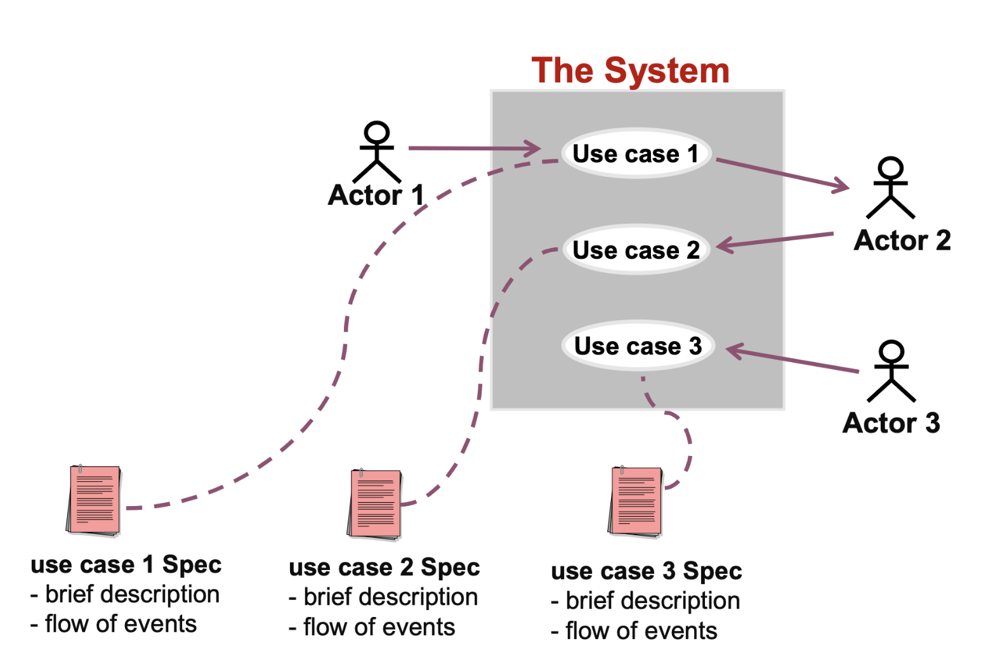

##Definitions: Actor and Use case 

* Actor: someone/something outside the 
system, acting in a role that interacts with the 
system
  * Who/what uses the system

* Use case: a sequence of actions performed by 
a system that yields an observable result of 
value to an actor (achieves a goal)
Brief

Actors Represent roles 



##<center>**Benefits of Use Case Modeling:**

* Gives context for requirements:
  * put sys. requirements in logical sequences 
  * illustrate why the system is needed 
  * help verify all requirements are captured 

* each to understand 

* facilitate agreement with customers

##<center>**LifeCycle of a Use Case:**

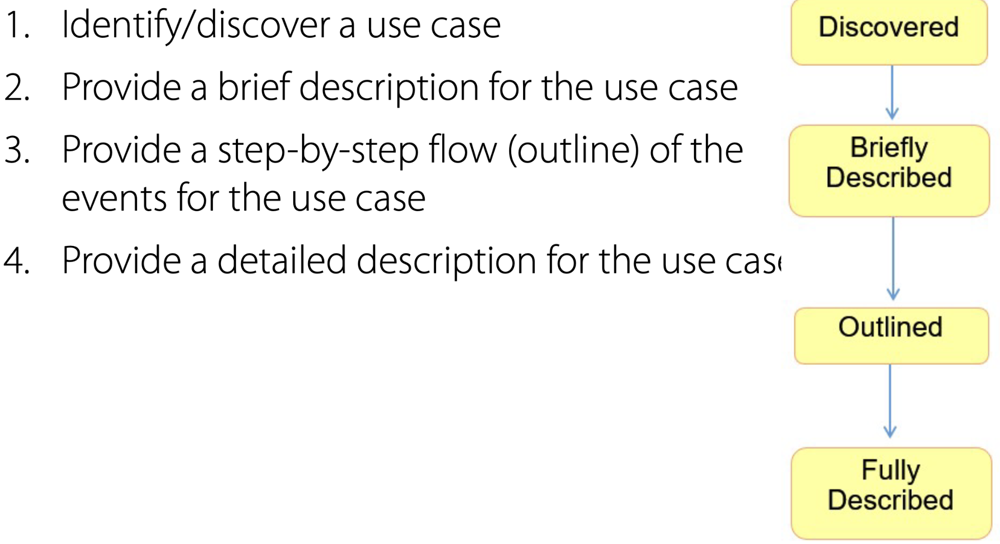

##<center>**Structuring Use Cases:**

* Factore out parts of use cases to make new ones 

###<center>**The "Include" relationship:**

* The behavior defined in the inclusion use case is explicitly included ointo the base use case
  * example, if a use case involves authentication, the we can make a new use case for authentication and then include the authentication use case into whatever other use case also needs to authenticate


###<center>**The "Extend" relationship:**

* Insert extension use case's behavior into base case ONLY IF the extending condition is true

###**Extend vs. Include:**

Extentions are taken only if a certain condition is true, 

Includes are ALWAYS taken by a certain use case

##<center>**Other Use case Concepts:**

* Inheritance relates a specialized and a generalized element
  * speacialized use case inherits the GOAL and ACTORS of its generalization, and may add more specific goals/steps to achieve them
  * A specialized actor inherits the use cases, attributes and 
associations of its generalization, and may add more

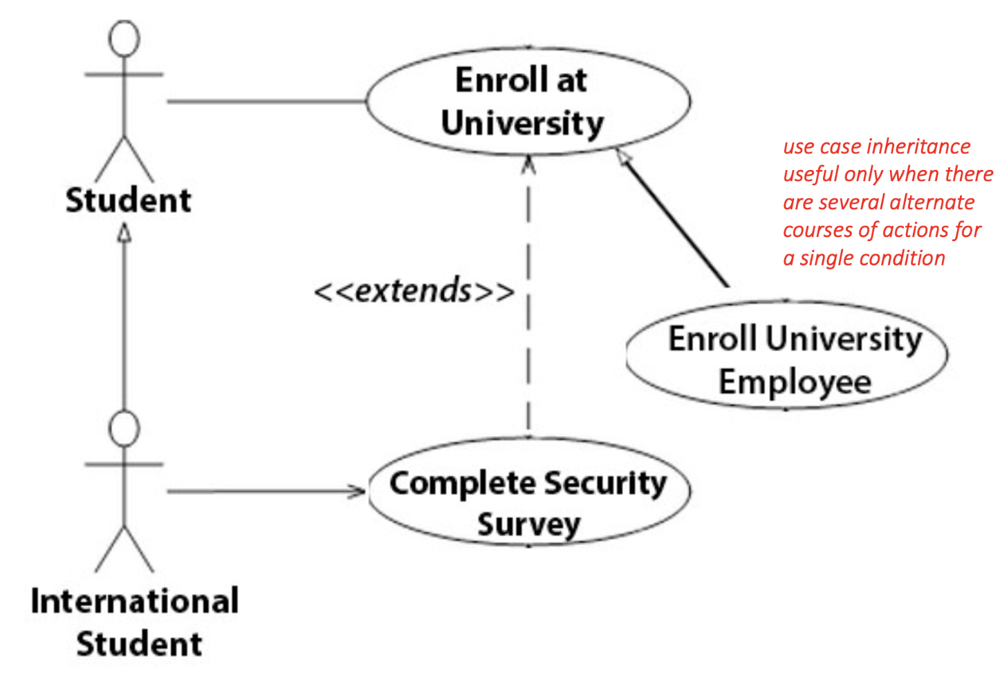

##<center>**Other Use case Concepts:**

* Multiplicity on association links
  * 1: to state that exactly one instance of a role participates in each link
  * 1..* : to state that one or more instance of a role participate in each link
  * 0..1 : to show participation is optional
  * * : to show that zero or more instances of a role participate in each link
  * Default : 1

##<center>**Reminder:**

- These use case models do not describe the "HOW", instead it merely maps out what desired functionalities are supposed to be and their relationships with other actors/functionalities

##<center>**Templates for Use Case Specification:**

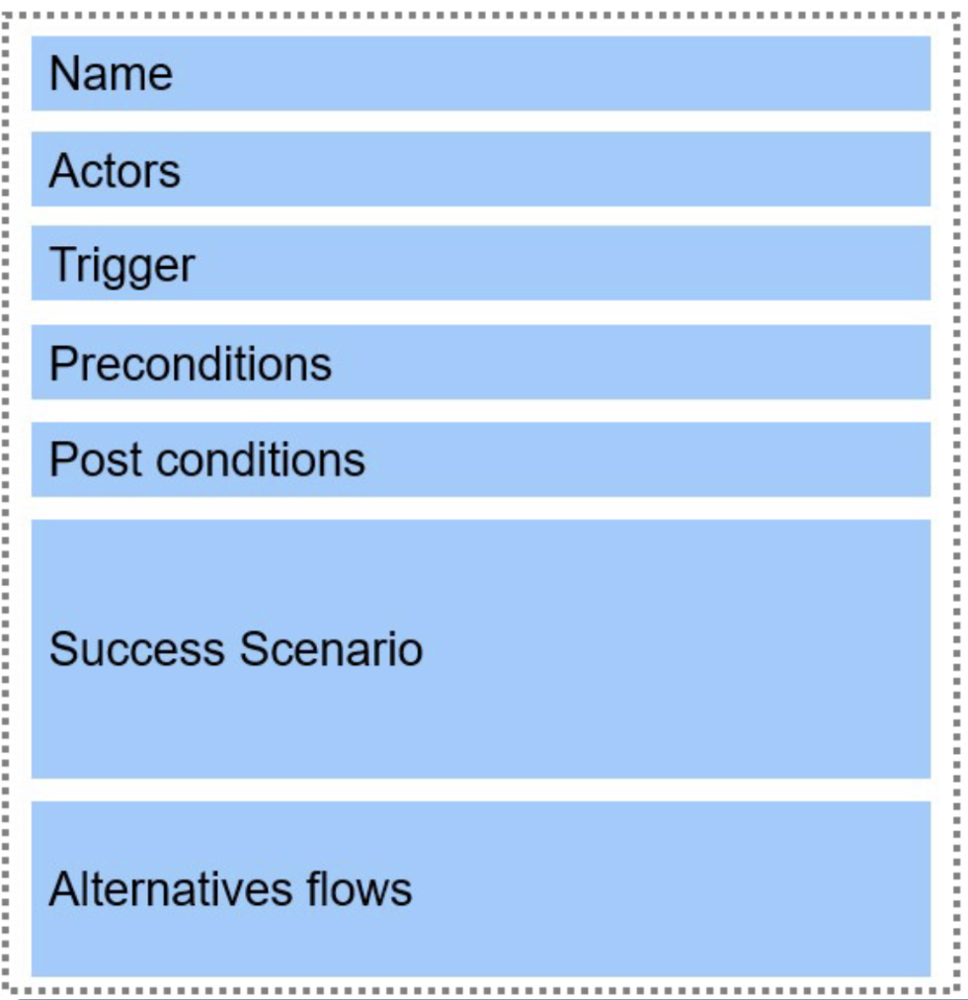

##<center>**Granularity of Use Cases**

* Summary Level 
> Written for either stategic or system scope; present collections of user level goals
>
> very high level 
* User goat level 
> Achieve a single, discrete, complete, meaningful, and 
well-defined task of interest to an actor
* Subfunction level
> Provide **"execution support"** for user-goal level use cases
>> * Low level and need to be justified, either for reasons of reuse or necessary detail
>> 
>> * often not clear who the primary actor of a subfunction-level use case is

Quick Examples:

**Summary level:** configure the database 

**User goal level:** create a virtual table 

**Subfunction level:** log into the database

These levels organize/visualize what the purpose of each use case is

Another Example:

Summary Level: Manage Funds by Bank Account
> describes the high level functionality of the process
>> people with bank accounts want their funds managed, but they don't do the management themselves, the bank does

User Goal Level: Deposit/Withdrawal money
> what the user actual does 
>> users actually want to interact with their money in the bank

Subfunction Level: Authenticate Client
> what supports the user goal 
>> in order for the user to interact with their bank account, they need to be authenticated first, even though users don't interact with their bank accounts to be authenticated, it still needs to happen 

##<center>**Summary of Use Case Modeling:**

* Use case describes a goal-oriented set of interactions between external actors and the system under consideration

* use case modeling alone is not the requirements, it is merely a way of narrowing down what the requirements are


#<center>**Brief Intro to UML Class Diagrams:**


##<center>**UML Class Diagrams:**

* show entities that comprise the classes of a system 
  * operations and attributes of the entity 
    * Relationship between entities 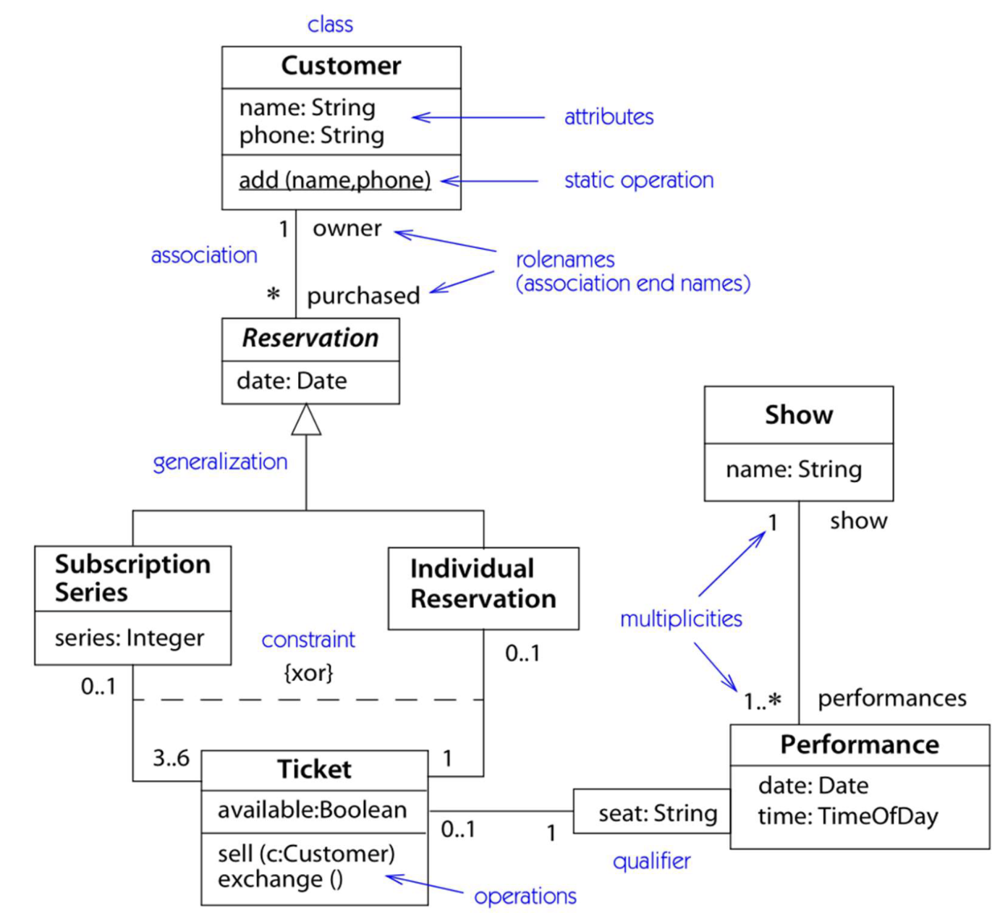

##<center>**A UML Class:**

* Name, Attributes, methods ( services, operation, interface, behavior )


|Name|
|---|
|Attributes|
|Behavior|

##<center>**UML Class Syntax:**

* Name: Commonly begins with uppercase letter
* Attributes: Define the properties of a class
  * [visibility] name [[multiplicity]] [: type] [=initial value][{property}]

* Operations (methods) : define the services that a class offers
  * [visibility] name [(parameter-list)] [: return-type ] [{property}]

##<center>**Class Attribute Syntax:**

* visibility: shows access rights to an attribute ( +, -, or # )
* type: initial value, common definitions
* multiplicity: how many instances of an attribute
* initial value: initial value of an attribute
* property: changeable, readOnly, addOnly, frozen

Example:

\- FirstName [1..50]: string

\- balance: Real = 1000.00

\- id: long {readOnly}

\+ lightOn: boolean = false

#<center>**Introduction to UML Class Diagram:**

| Name |
| ---- |
| Attributes |
| Methods |

##<center> Examples of Class Methods:
\+ isLightOn() : boolean 

\+ addColor( newColor: Color )

\# convert2point(x: int, y: int):Point

etc... 

##<center>**Various UML classes:**

Many different types of class 
  \- ```<<interface>>``` or {abstract} declare a set of public methods, but no mehtod bodies

others like, "utility" and "template"

##<center>**Relationships Between Classes:**

* Association:
  * Aggregation
  * Composition

* Generalization

* Dependency:
  - Realization (interfaces)

    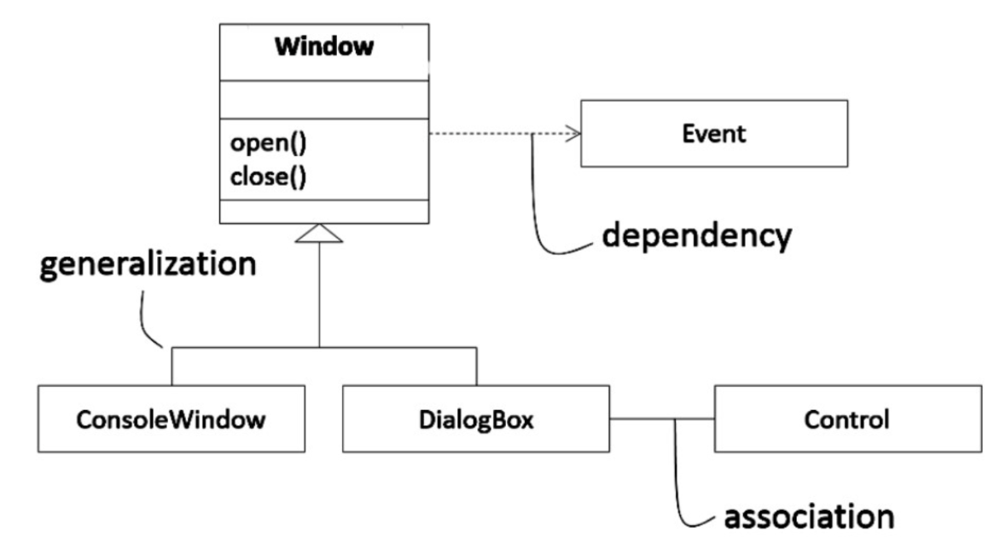

##<center>**Class Association:**

* Association: 
  * structural relationship, specifies that object of one class are CONNECTED to objects of another
    * the logical relationship/connection between object of one class and objects of another
    * graphically: solid line connecting same/different class

  * can be implemented in many ways (depends on programming language to be used)

Association Example:

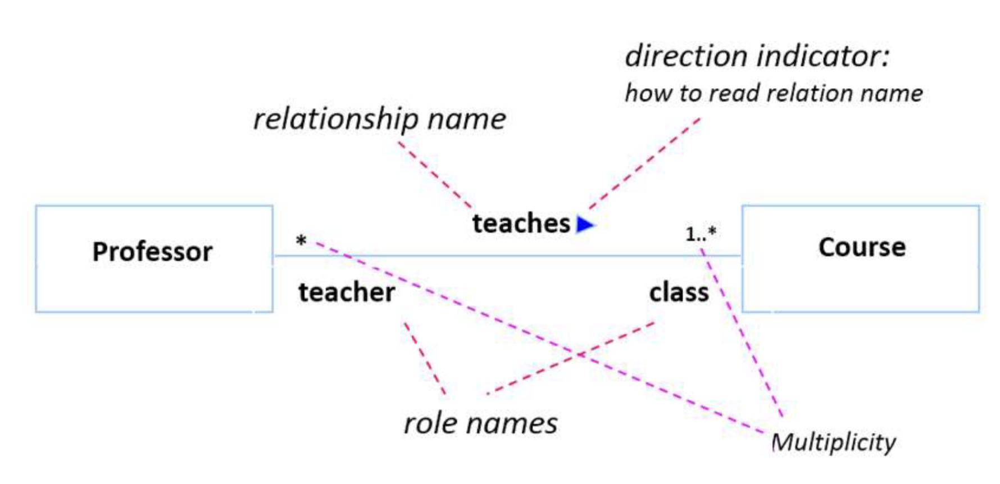

##<center>Association Navigability:

* if an association has an arrow at one end, then it shows that the association is navigable in that direction ONLY

##<center> **Association Attributes:**

**Name:** identifies the association ( near the midpoint of the association )
**Roles:** at each end of an association: can be used to refer to the associated object

**Multiplicity:**
  1

  0..1 (optional)
  
  1..* (1 or more)
  
  \* (zero or more)
  
  n..m (collection of between n and m number of objects)

  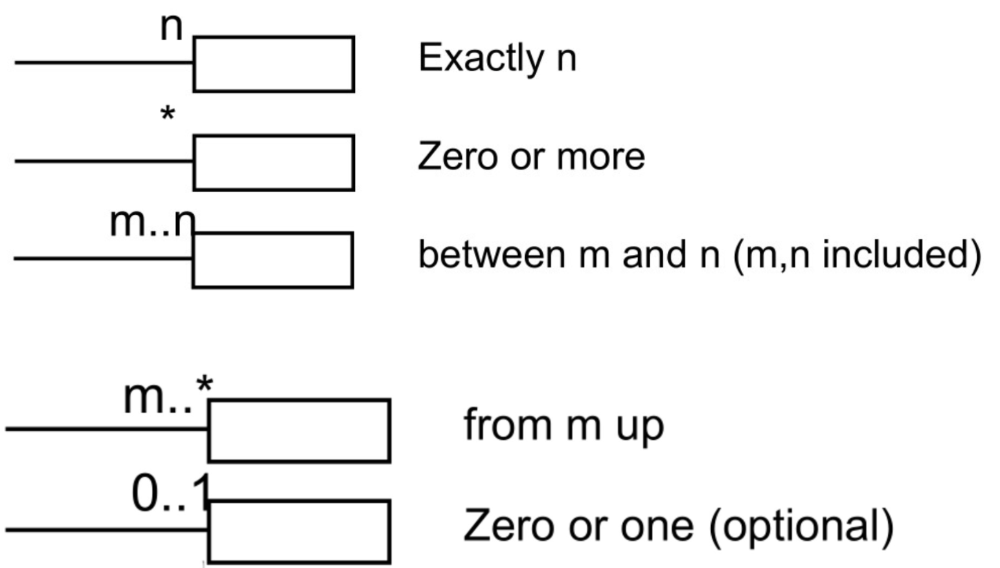

##<center>**Reflexive Associations:**

* association from one class to itself

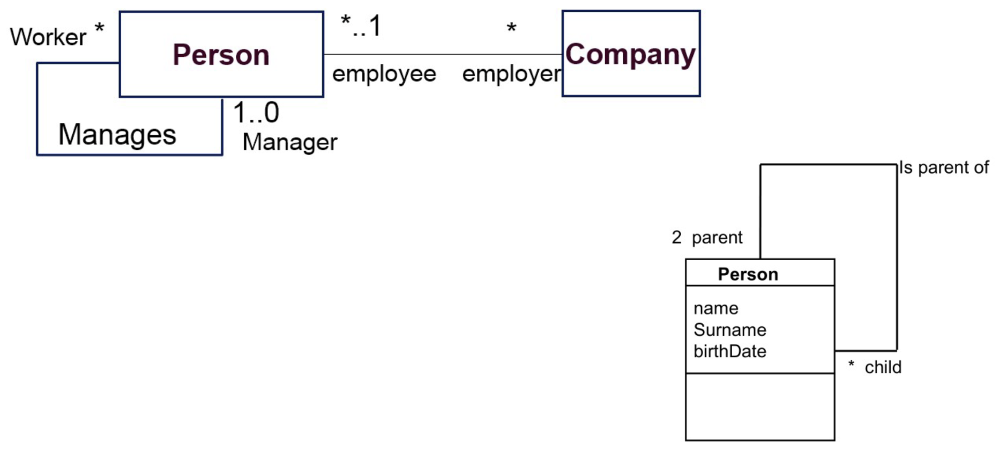

## **The above can be interpretted as:**

Some individual "Person" could manage any number of Worker, in the other direction, some individual "Person" may have 1 or zero managers

an individual Person may have 1..* employers

a company can have any number of employees 

##<center>Multiple Relations (associations)

* There may be more than one relationships between two classes 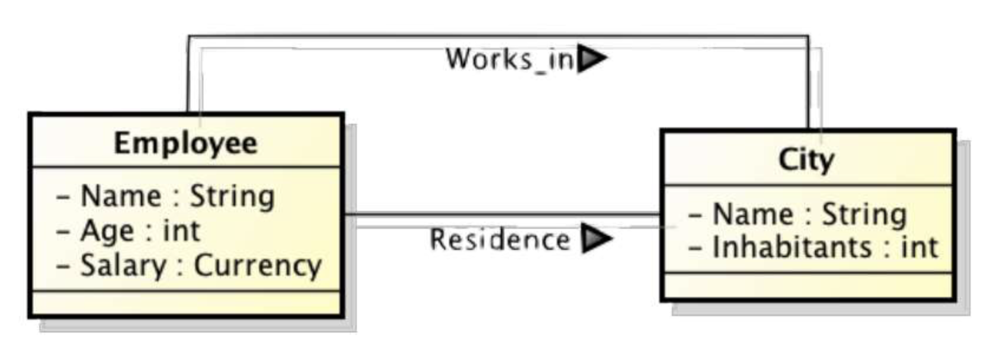

##<center> Association Roles:

* Option; makes associations more meaningful 

in the above, employee "works_in" city, this association role is one directional

##<center> **Aggregation Association:**

* Represents whole/part ( or "has a" relationship )

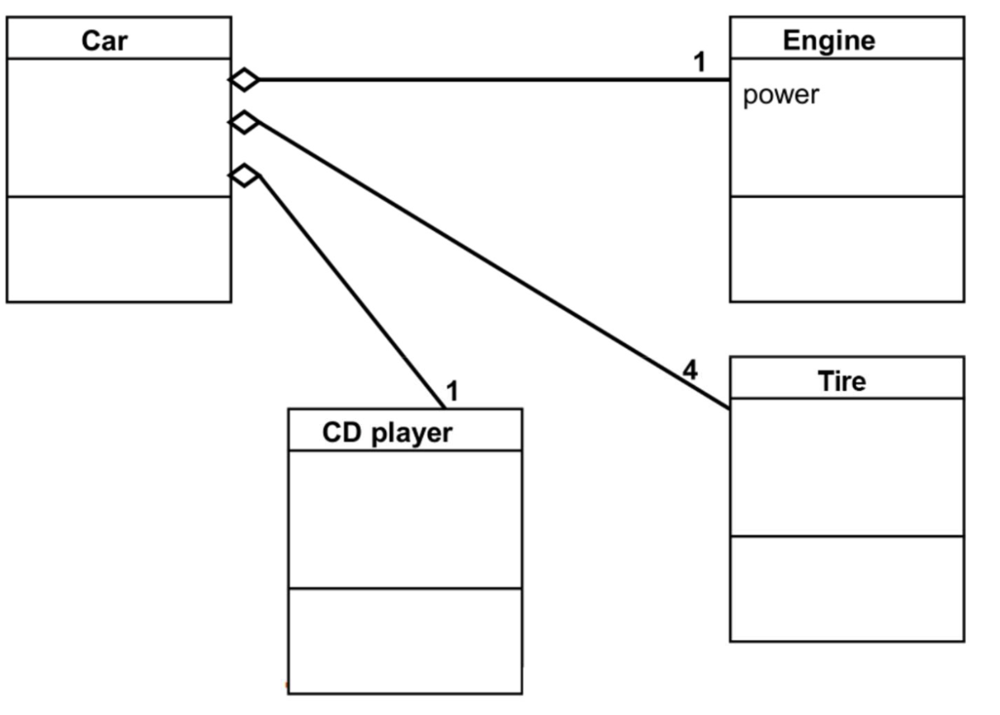

**In the Above:**

A car has:
  * 1 Engine
  * 4 Tires
  * 1 CD player

##<center>**Composition Association:**

* Similar to aggregation but the part LIVE and DIE with the whole 

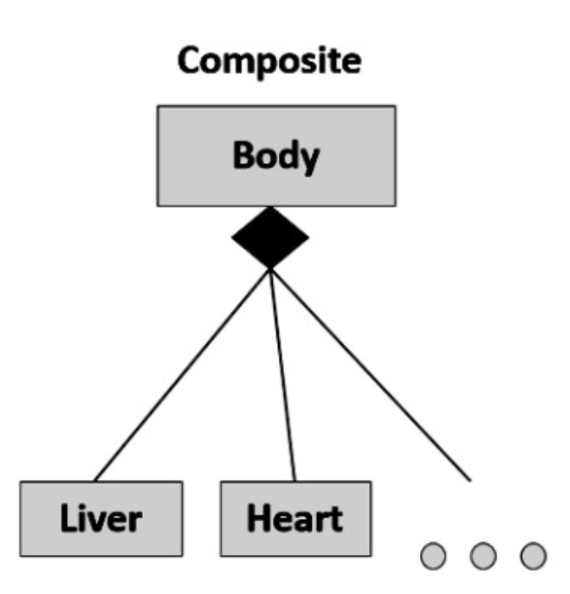

## **above**

if the body dies, so do the Liver, Heart, etc...

##<center>**Composition VS. Aggregation:**

* Student Registration: clearly not a composition ( a sutdent could be in several courses ), if a class is cancelled the student is not destroyed 

* Campaign advert: if a marketing campaign is canceled, the ads run for that campaign are also cancelled

##<center>**Generalization Association:**

* Reflects an "is a" relationship 
  * example: 
    * given a shape class with methods:
      - draw()
      - area()

    * this shape class is a generalization for specific shapes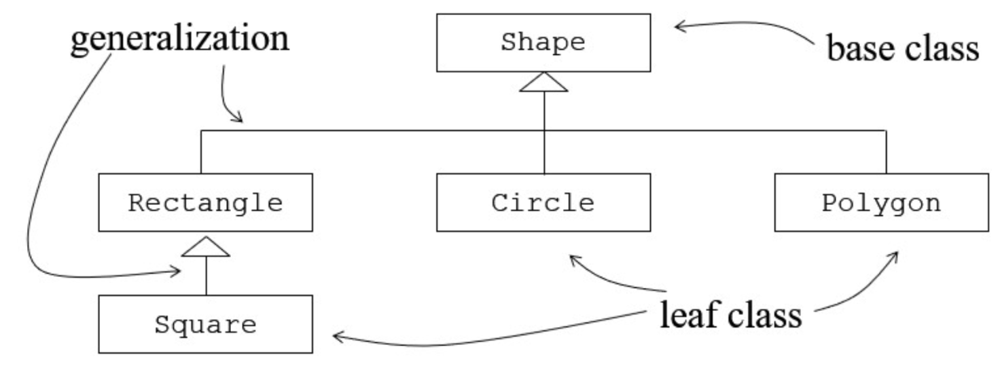

##<center>**Generalization**

* relationship between general Entities ( parent/superclass ) and more specific entities ( child/subclass )
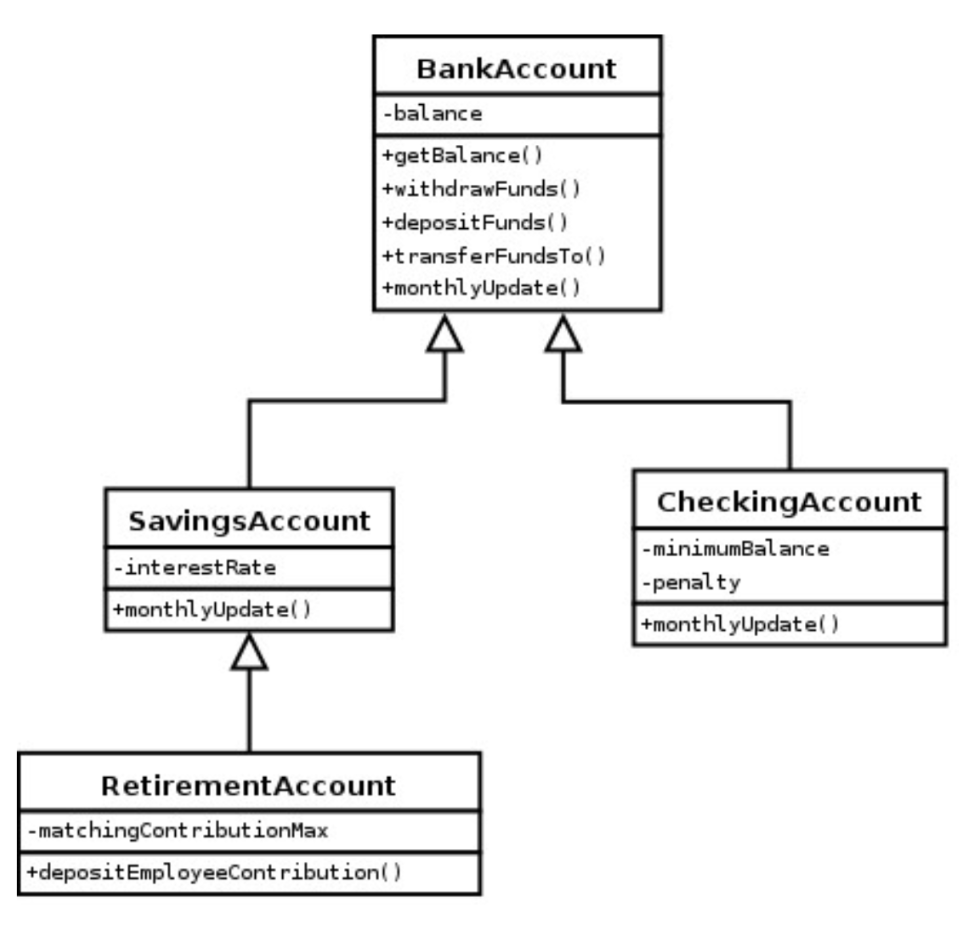

##<center>**Generalization Properties:**

* a class may have zero or more parents 
* a **base** class is a class with no parent and one or more children
* a **leaf** class have no children 
* *simple inheritance:* a class has exactly one parent
* *multiple inheritance:* a class has more than one parent 
* notation: a solid line with triagle at end of it

##<center>**Generalization Constraints:**

* Complete: all subclasses have been specified ( no more are expected )
* Incomplete: some subclasses have been specified but it is KNOWN that others exist
* Disjoint: objects of parent type can be specialized by no more than ONE child class 
* Overlapping: objects of parent type can be specialized by one or more child classes 

##<center> **Interface Classes:**

*  An interface (pure abstract) class describes the visible behavior of a set of objects

##<center>**Dependency Relationship:**

* a change in one thing may affect another 
* similar to "uses" relationship 
* always directed, dashed line with arrow at the end


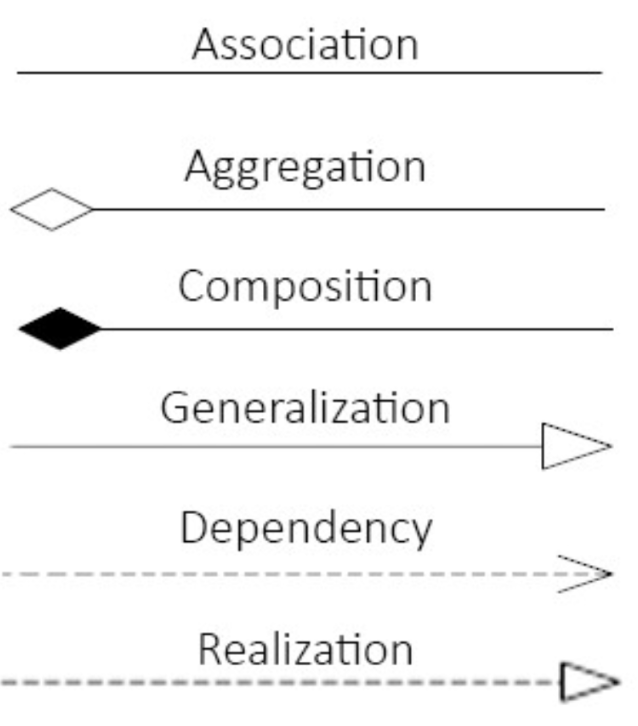

##<center>**Requirements phase:**

Worry about "What is" not "how is"

understand the domain and the relationships of entities in that domain
  - don't think about implementation yet

##Practive in Class:

UML class diagram to capture:
  every student is introlled in some courses. each student has a major. courses can be elective or core courses for the major. each course has a number of credit hours. students are limited to a maximum of six courses per semester. Int'l students must register in at least 3 courses. a student can have two majors

  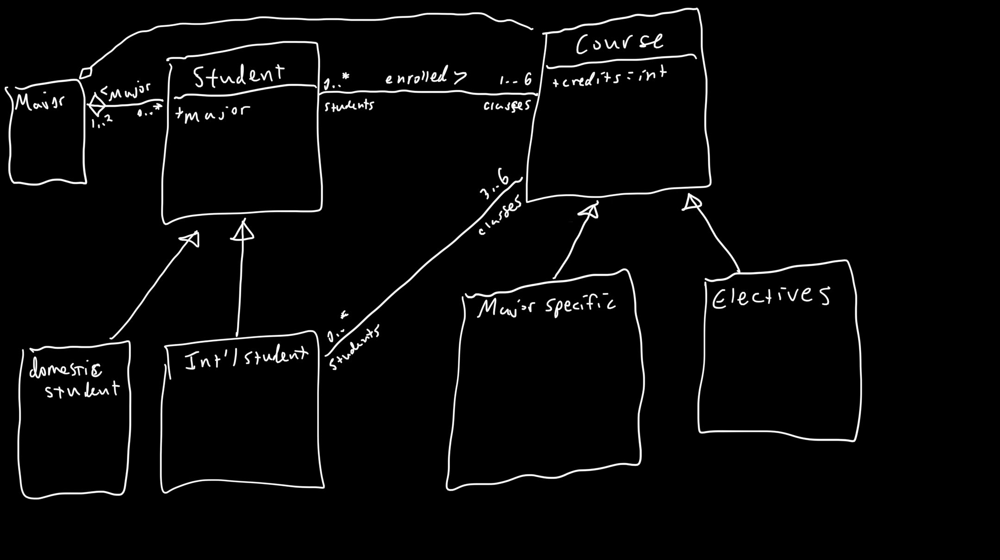

#<center>**Guest Speaker: The Jayhawk SFS Program**

prof. Bo Luo 

Scholarship opportunity

- The CyberCorps( R ): Scholarship for Service
  * increase number of qualified students in CyberSecurity Field

Tuition is covered ( 16 credit hours )
Professional Development Allowance: $4000
Books allowance: $2000/year
Health Insurance: $3000/year

STIPEND: ( in addition to the above ): $22,400/year for UnderGrad

can receive scholarship for 2-3 years
  - 2 years for UG
  - 3 years for UG + MS

Education & Research:
  BS: EECS 565, 455/465 + electives ( discuss with SFS PI ); security related capstone

Post graduation servie requirement:
  - work for federal/state/local gov't equal to scholarship length: one yaer of scholarship for one year of work
  - summer internship with gov't agencies

  - you apply to positions and pick from offers
    - not guaranteed a position


Eligibility: 
  - enrolled in IA program, within 2-3 years of graduation
  - US citizen
  - Eligible for Federal Employment

UG student Admission:
  - EECS BS students with good academic standing
  - completed Upper Level Eligibility
  - commitment to security as a profession
  - in-person interview 
  - background check

[Link to Application](http://sfs.ku.edu)

#<center>**UML Object Diagrams:**

* Instances of classes ( varying levels of details can be presented )

Reference to an actual instance of a class, with initialized values

Example:

| triangle: Polygon |
| --- |
| center = (0,0) |
| vertices = ((0,0),(4,0),(4,3)) |
| borderColor = black |
| fillColor = white |


This is an Object diagram for a triangle which inherits from Polygon

##<center>Class vs. Object

Class: Exam

| Exam |
|---|
| date |
| grade |

Object: Exam

| Exam |
| --- |
| data = 12/3 |
| grade = 96% |

##<center>**UML Package Diagrams:**

* a package may contain model elements of different kind ( including other packages )

  - defines a namespace for its contents
  - Can be used for varying purposes
    - primarily for managing ( grouping & organizing ) a large set of related items ( classes, other packages, )
      - not actually limited to class diagrams 
      - just used for grouping related items ( could be any type of diagrams )




##<center>**Package Notation:**

**Package**: grouping of elements

**Import**: A dependency identifying that the public contents of the target package are added to the namespace of the source package

**Access**:  a dependency indicating that the public contents of the target package are available in the namespace of the source package

##<center>Package Import Example:

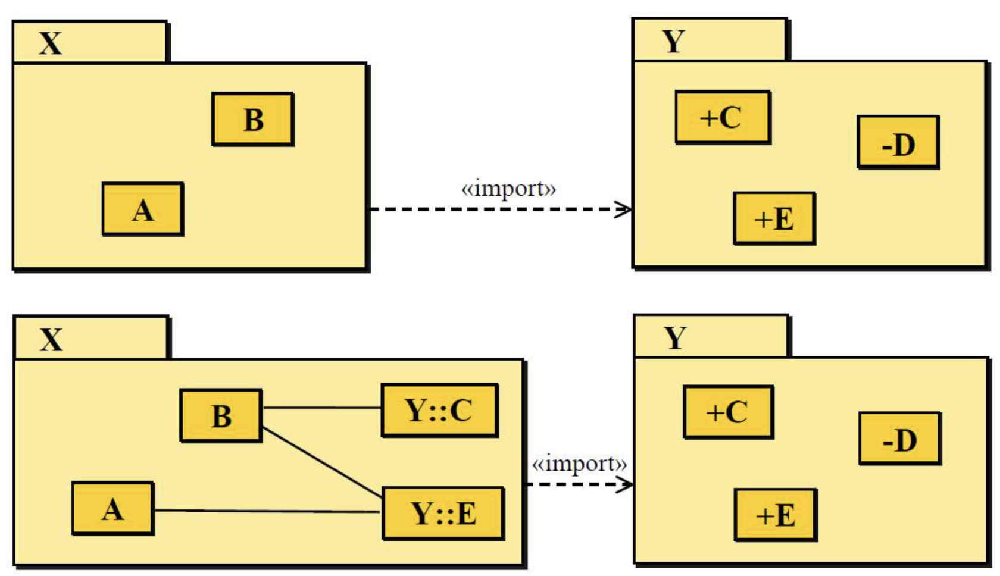

##In the Above:

B uses C and E from package Y 
A uses E from package Y

##<center> Package Access Example:

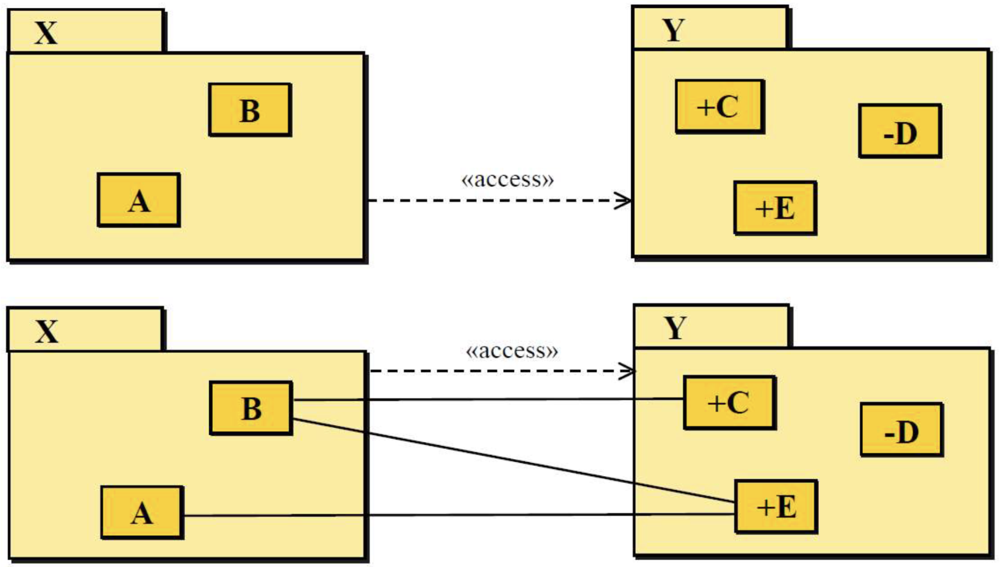

##In the Above:

B uses some methods from C and E in Y
A uses some methods from E in Y

##<center>**Relation between UML and programming languages:**

* UML is a graphical language

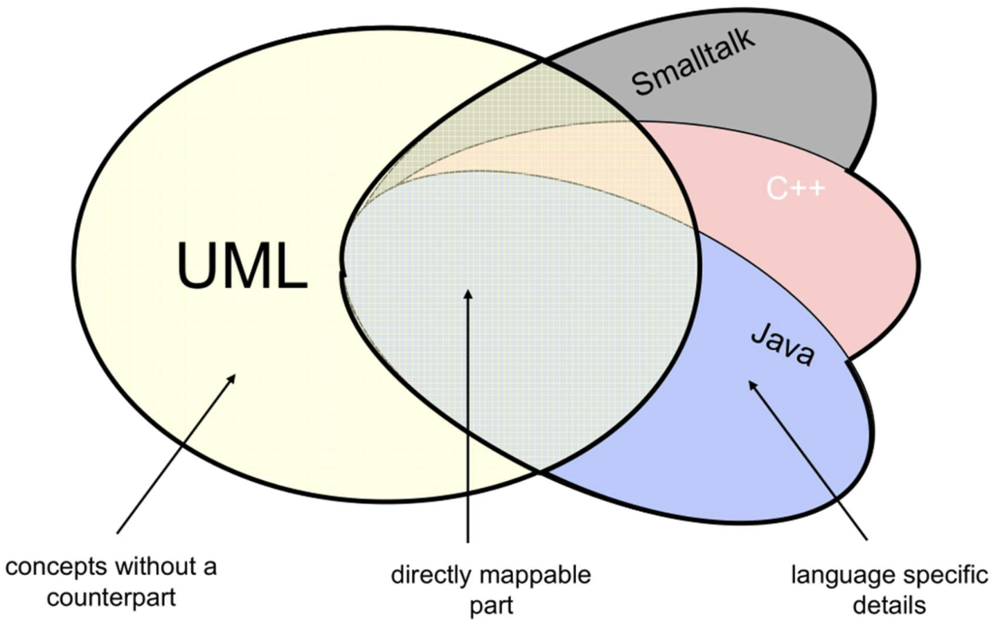